In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import scvelo as scv
scv.settings.verbosity = 0
import unitvelo as utv

import warnings
warnings.filterwarnings("ignore")

(Running UniTVelo 0.2.5.2)
2024-09-01 07:20:18


In [2]:
scv.settings.verbosity = 3
scv.settings.presenter_view = True
scv.set_figure_params('scvelo')
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 200)
np.set_printoptions(suppress=True)

fig_path = '/data/nelkazwi/RNA_velo/Unitvelo_atac/CRAK_Velo_fig/'

# Mouse_Brain_10X

In [55]:
save_dir = "0828_170123"
path_result = "/data/nelkazwi/RNA_velo/Unitvelo_atac/E18_mouse_brain_10X/Mode_1/checkpoints/VelocityDemo/"
adata = sc.read(path_result+str(save_dir)+"/model_last.h5ad")
#adata_atac = sc.read(path_result+str(save_dir)+"/model_last_atac.h5ad")

In [56]:
all_clusters = ['Upper Layer',
                'Deeper Layer',
                'V-SVZ',
                'RG, Astro, OPC',
                'Ependymal cells',
                'IPC',
                'Subplate']
adata.obs['celltype'] = adata.obs['celltype'].cat.reorder_categories(all_clusters)

In [21]:
path = "/data/nelkazwi/RNA_velo/Unitvelo_atac/unitvelo_alone/E18_mouse_brain_10X/"
adata_unv = sc.read_h5ad(path+"unitvelo_fit_data_mv_cells.h5ad")

In [44]:
adata_mv = sc.read_h5ad(
    '/data/nelkazwi/RNA_velo/Unitvelo_atac/E18_mouse_brain_10X/Multivelo_mouse_brain_demo/multivelo_result_2.h5ad')

In [57]:
scv.pp.normalize_per_cell(adata_mv)
scv.pp.log1p(adata_mv)
scv.pp.moments(adata_mv)

computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [50]:
adata.obsm['X_umap'] = adata_mv.obsm['X_umap']

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


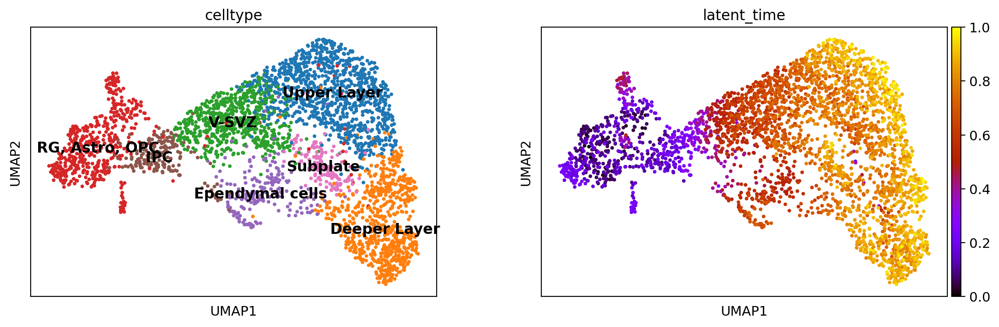

In [58]:
sc.pp.neighbors(adata)
scv.pp.normalize_per_cell(adata)
scv.pp.log1p(adata)
scv.pp.moments(adata)
sc.tl.umap(adata, n_components=2,random_state=42)
sc.pl.umap(adata,color=["celltype","latent_time"],legend_loc = 'on data',color_map='gnuplot')


computing velocity graph (using 1/112 cores)


  0%|          | 0/3365 [00:00<?, ?cells/s]

    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


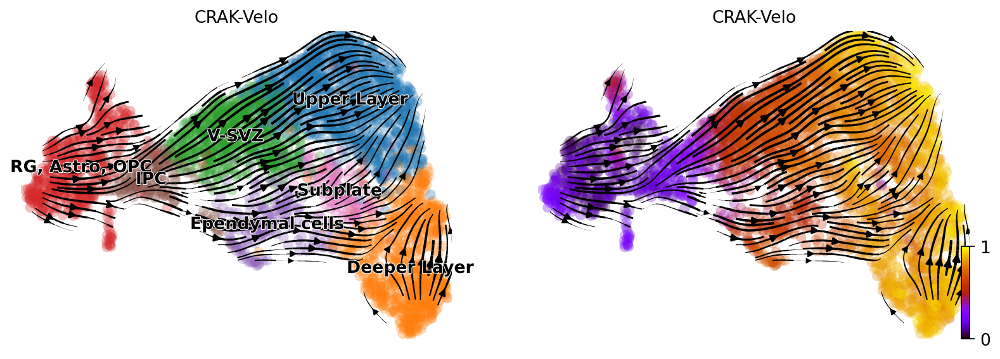

In [59]:
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(adata, color=['celltype', "latent_time"], dpi=100, title=['CRAK-Velo'],color_map='gnuplot')

saving figure to file /data/nelkazwi/RNA_velo/Unitvelo_atac/CRAK_Velo_fig/10X_mouse_brain_CRAK-Velo.png


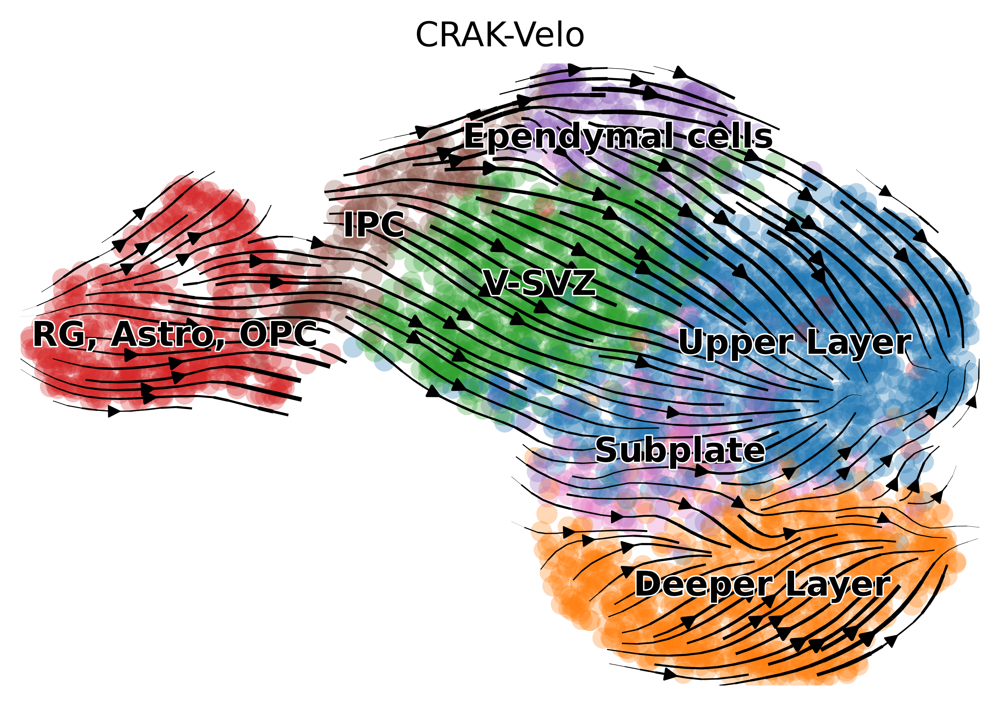

In [11]:
# scv.pl.velocity_embedding_stream(adata, color=['celltype'], title=['CRAK-Velo']
#                                  , save=fig_path+'10X_mouse_brain_CRAK-Velo.png', dpi=300)




saving figure to file /data/nelkazwi/RNA_velo/Unitvelo_atac/CRAK_Velo_fig/10X_mouse_brain_latent_time.png


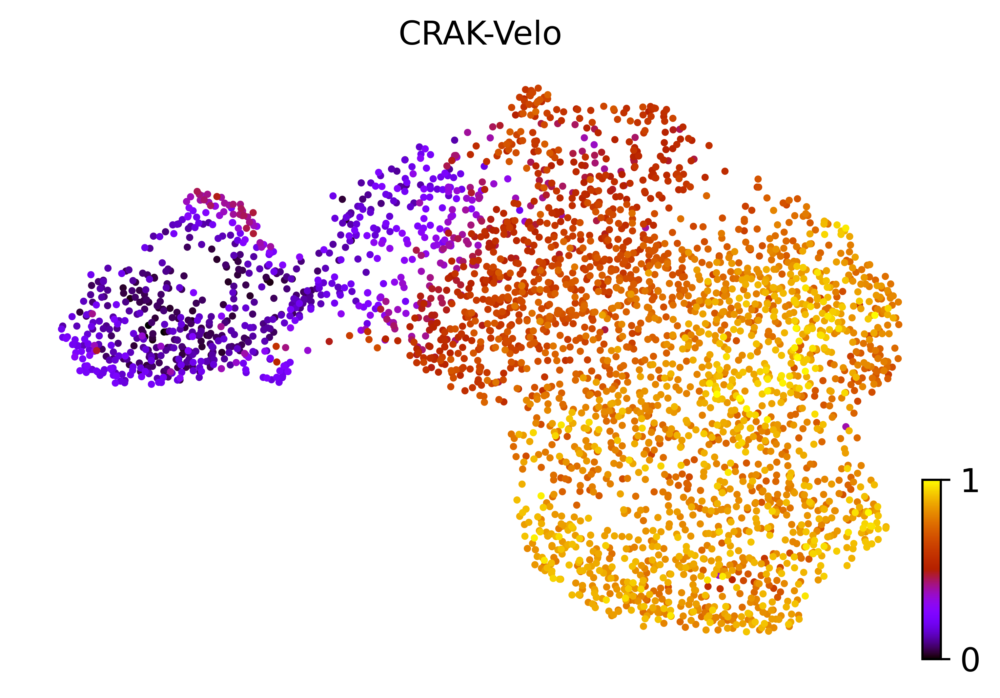

In [12]:
scv.pl.scatter(adata, color=['latent_time'], title=['CRAK-Velo']
                                 , save=fig_path+'10X_mouse_brain_latent_time.png', dpi=300, color_map='gnuplot')

In [26]:
adata_unv.obsm['X_umap'] = adata.obsm['X_umap']

computing velocity graph (using 1/112 cores)


  0%|          | 0/3365 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


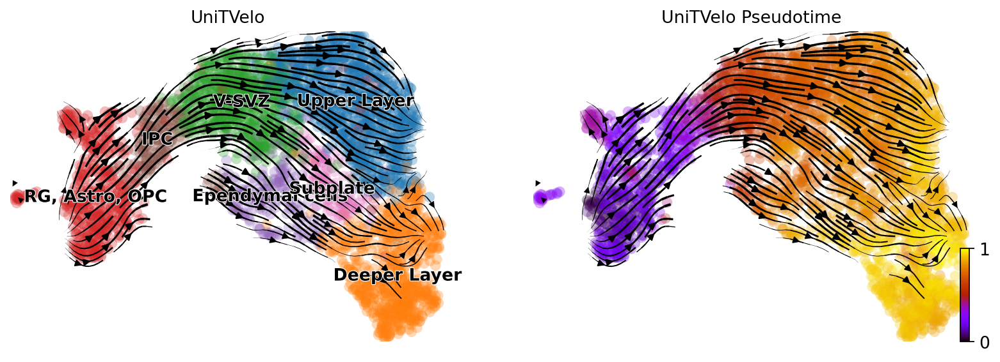

In [31]:
sc.pp.neighbors(adata_unv)
sc.tl.umap(adata_unv, n_components=2)
adata_unv.obs['celltype'] = adata_unv.obs['celltype'].cat.reorder_categories(all_clusters)
scv.tl.velocity_graph(adata_unv)
scv.pl.velocity_embedding_stream(adata_unv, color=['celltype','latent_time'], dpi=100, title=['UniTVelo', 'UniTVelo Pseudotime'],color_map='gnuplot')

In [60]:
adata_mv.obsm['X_umap'] = adata.obsm['X_umap']

saving figure to file /data/nelkazwi/RNA_velo/Unitvelo_atac/CRAK_Velo_fig/10X_mouse_brain_UniTVelo.png


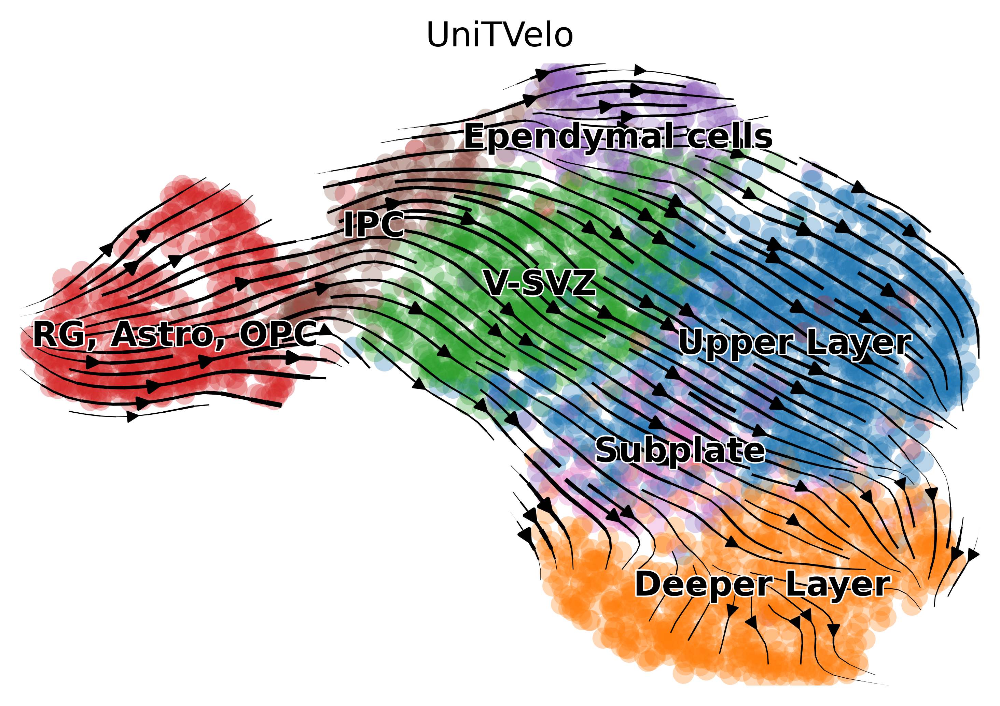

In [16]:
scv.pl.velocity_embedding_stream(adata_unv, color=['celltype'], title=['UniTVelo']
                                 , save=fig_path+'10X_mouse_brain_UniTVelo.png', dpi=300)

computing velocity graph (using 1/112 cores)


  0%|          | 0/3365 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


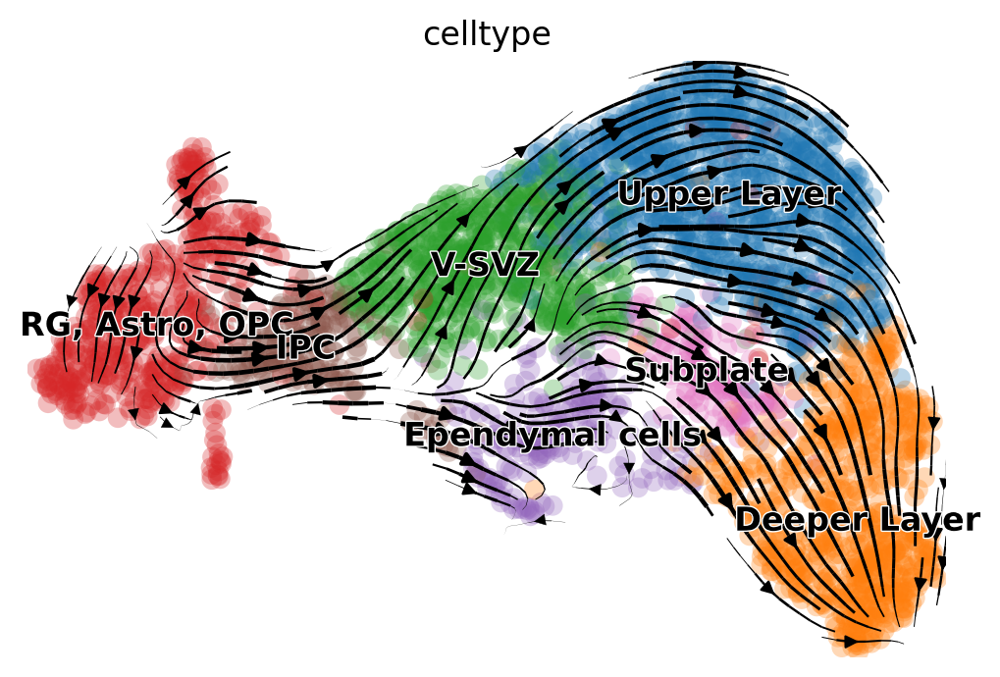

In [61]:
# sc.pp.neighbors(adata_mv)
#sc.tl.umap(adata_mv, n_components=2)
# scv.tl.umap(adata_mv)
# scv.pl.umap(adata_mv, color='celltype')
scv.tl.velocity_graph(adata_mv)
scv.pl.velocity_embedding_stream(adata_mv, color=['celltype'], color_map='gnuplot')# vkey='velo_s_norm',

saving figure to file /data/nelkazwi/RNA_velo/Unitvelo_atac/CRAK_Velo_fig/10X_mouse_brain_MultiVelo.png


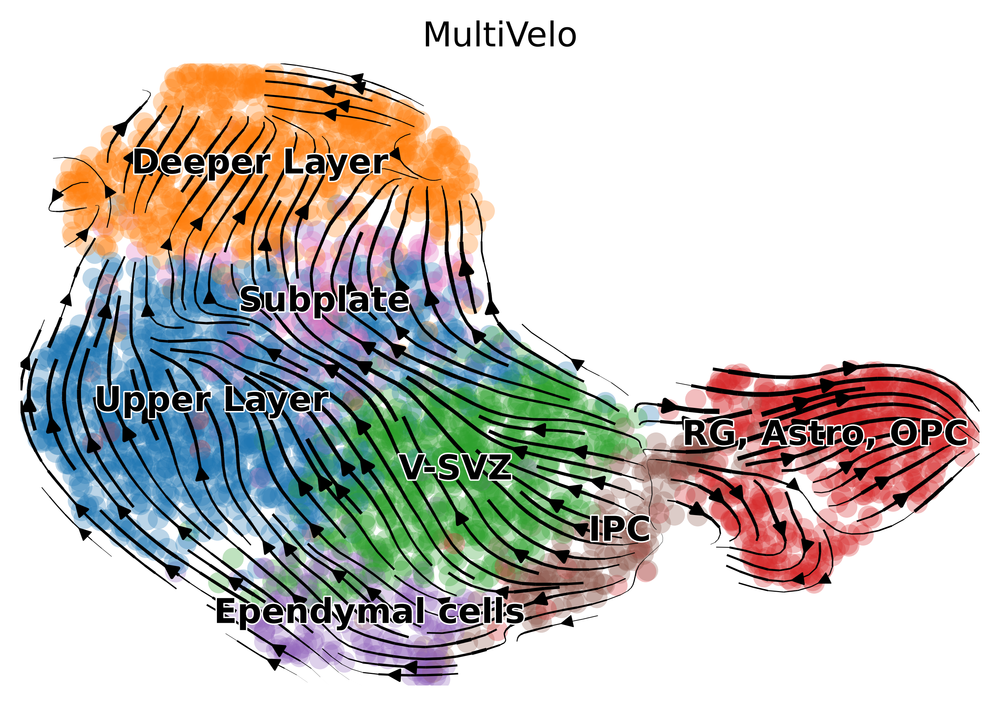

In [137]:
scv.pl.velocity_embedding_stream(adata_mv, color=['celltype'], title=['MultiVelo'], vkey='velo_s_norm'
                                 , save=fig_path+'10X_mouse_brain_MultiVelo.png', dpi=300)

# Human_Cerebral_Cortex


In [8]:

save_dir = '0819_120521'
data_set = 'Human_Cerebral_Cortex/Mode_2'
path_result = '/data/nelkazwi/RNA_velo/Unitvelo_atac/'+data_set+'/checkpoints/VelocityDemo/'
adata = sc.read(path_result+str(save_dir)+"/model_last.h5ad")
adata_atac = sc.read(path_result+str(save_dir)+"/model_last_atac.h5ad")

In [9]:
adata_atac

AnnData object with n_obs × n_vars = 4693 × 1130
    obs: 'index', 'celltype', 'n_counts'
    var: 'chrom', 'chromStart', 'chromEnd', 'n_counts'
    uns: 'celltype_colors', 'neighbors', 'umap'
    obsm: 'X_umap', 'cisTopic'
    obsp: 'connectivities', 'distances'

In [10]:
path_unv = "/data/nelkazwi/RNA_velo/Unitvelo_atac/unitvelo_alone/Human_Cerebral_Cortex/"
adata_unv = sc.read(path_unv+'unitvelo_fit_data_mv_cells.h5ad')

In [11]:
adata_mv = sc.read_h5ad('/data/nelkazwi/RNA_velo/Unitvelo_atac/Human_Cerebral_Cortex/multivelo_fit.h5ad')

In [12]:
adata.obsm["X_umap"] = adata_mv.obsm["X_umap"] 
adata_unv.obsm["X_umap"] = adata_mv.obsm["X_umap"] 

  0%|          | 0/4693 [00:00<?, ?cells/s]

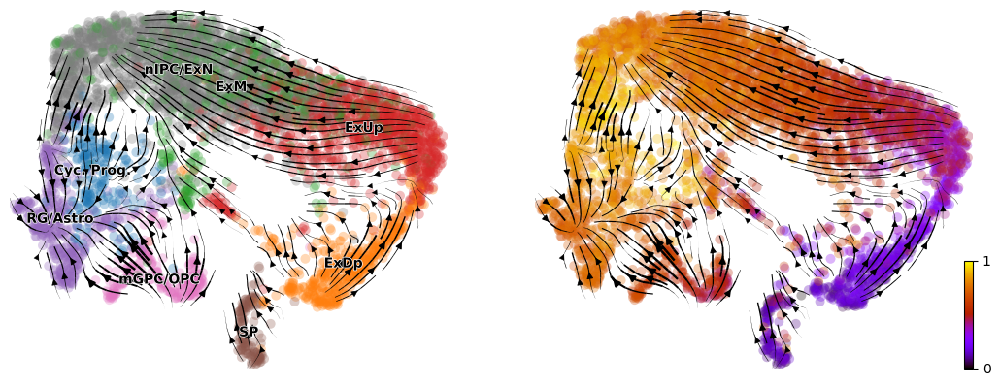

In [13]:
# sc.pp.neighbors(adata)
# sc.tl.umap(adata, n_components=2)
# # sc.pl.umap(adata,color=["celltype","latent_time"],legend_loc = 'on data',color_map='gnuplot')
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(adata, color=['celltype','latent_time'], dpi=100, title='',color_map='gnuplot')

In [42]:
cluster_edges = [
     
    ('ExUp','ExDp'), 
    ]

In [ ]:
scv.pp.neighbors(adata_unv)
#adata_velo = adata_unv[:, adata_unv.var.loc[adata_unv.var['velocity_genes'] == True].index]
utv.evaluate(adata_unv, cluster_edges, "celltype", 'velocity', 'X_umap')

  0%|          | 0/4693 [00:00<?, ?cells/s]

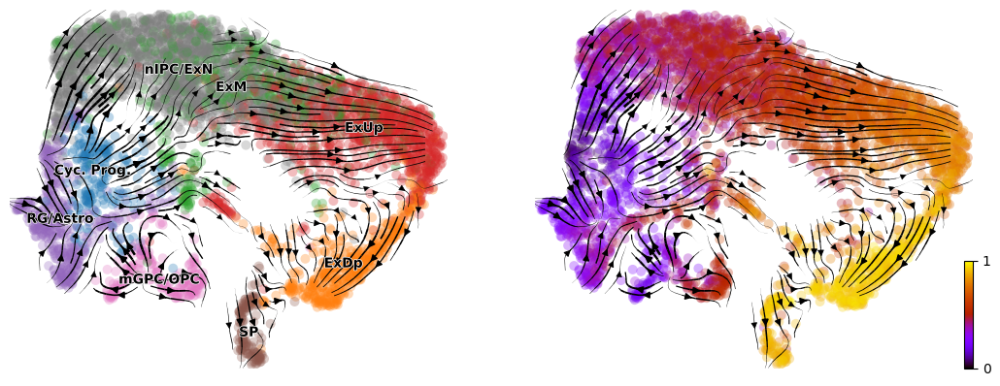

In [72]:
scv.tl.velocity_graph(adata_unv)
scv.pl.velocity_embedding_stream(adata_unv, color=['celltype','latent_time'], dpi=100, title='',color_map='gnuplot')

In [23]:
dataset = '/data/nelkazwi/RNA_velo/Unitvelo_atac/Human_Cerebral_Cortex/RNA_data.h5ad'
label = 'celltype'
exp_metrics = {}
velo_config = utv.config.Configuration()
velo_config.R2_ADJUST = True
#velo_config.IROOT = 'IPC'
velo_config.FIT_OPTION = '1'
velo_config.AGENES_R2 = 1
velo_config.MAX_ITER = 5000
adata = utv.run_model(dataset, label, config_file=velo_config)
path = "/data/nelkazwi/RNA_velo/Unitvelo_atac/unitvelo_alone/Human_Cerebral_Cortex/"
adata.write_h5ad(path+"unitvelo_fit_data_5000.h5ad")
#adata_unv.write( "/data/nelkazwi/RNA_velo/Unitvelo_atac/unitvelo_alone/Human_Cerebral_Cortex/unitvelo_fit_data.h5ad")

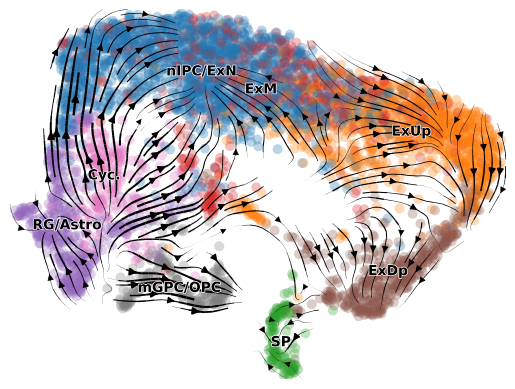

In [18]:
#scv.tl.velocity_graph(adata_mv)
scv.pl.velocity_embedding_stream(adata_mv, color=['cluster'], dpi=100, title='',color_map='gnuplot')

# HSPC

In [ ]:
dataset = '/data/nelkazwi/RNA_velo/Unitvelo_atac/HSPC/RNA_data.h5ad'
label = 'celltype'
exp_metrics = {}
velo_config = utv.config.Configuration()
velo_config.R2_ADJUST = True
#velo_config.IROOT = 'IPC'
velo_config.FIT_OPTION = '1'
velo_config.AGENES_R2 = 1
velo_config.MAX_ITER = 10000
adata = utv.run_model(dataset, label, config_file=velo_config)
path = "/data/nelkazwi/RNA_velo/Unitvelo_atac/unitvelo_alone/HSPC/"
adata.write_h5ad(path+"unitvelo_fit_data.h5ad")

In [3]:
save_dir = '0724_103433'
data_set = 'HSPC/Mode_1'
path_result = '/data/nelkazwi/RNA_velo/Unitvelo_atac/'+data_set+'/checkpoints/VelocityDemo/'
adata = sc.read(path_result+str(save_dir)+"/model_last.h5ad")
adata_atac = sc.read(path_result+str(save_dir)+"/model_last_atac.h5ad")

In [24]:
path = '/data/nelkazwi/RNA_velo/Unitvelo_atac/HSPC/'
adata_mv = sc.read(path + "adata_postpro.h5ad")

In [5]:
adata.uns["celltype_colors"] = adata_mv.uns["leiden_colors"]
adata.obsm["X_umap"] = adata_mv.obsm["X_umap"]

computing velocity graph (using 1/112 cores)


  0%|          | 0/11605 [00:00<?, ?cells/s]

    finished (0:00:26) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


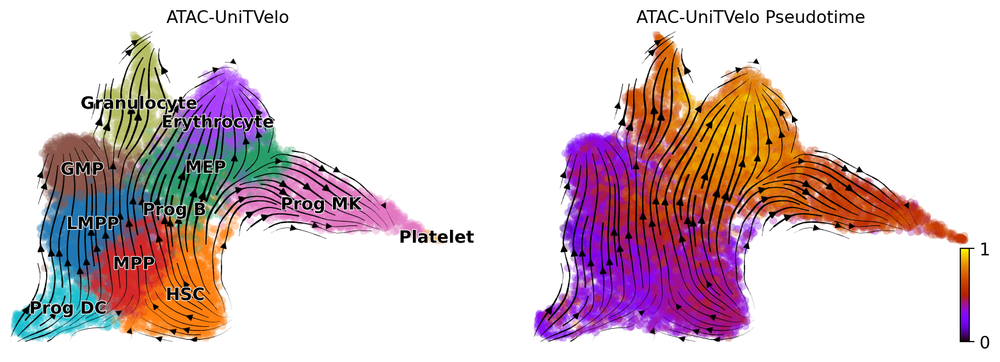

In [6]:
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(adata, color=['celltype','latent_time'], dpi=100, title=['ATAC-UniTVelo', 'ATAC-UniTVelo Pseudotime'],
                                  color_map='gnuplot')

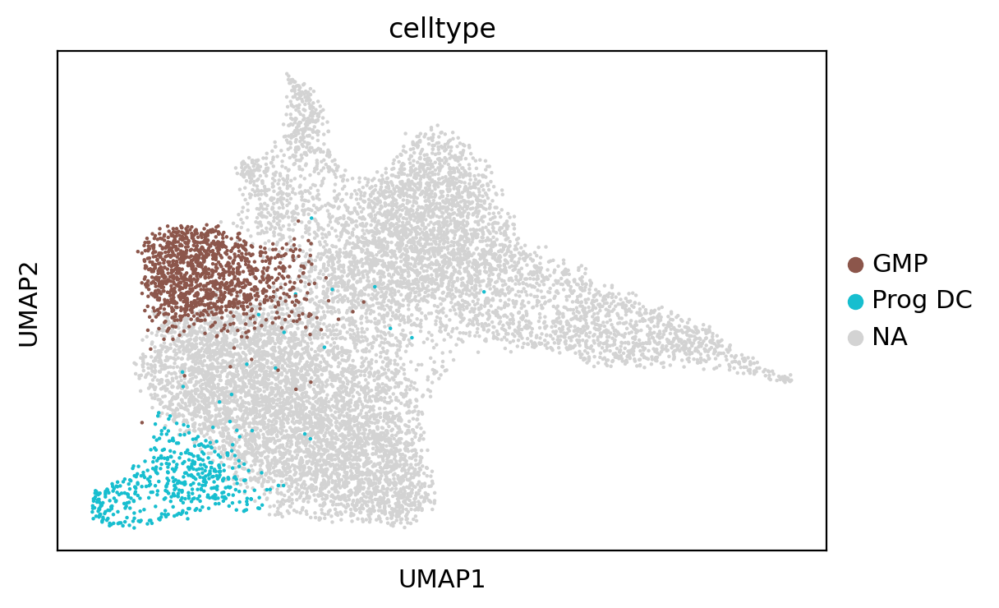

In [107]:
sc.pl.umap(adata, color = 'celltype', groups=['GMP','Prog DC'])

In [9]:
trajectories = {
    "T1": ['HSC', 'MPP', 'LMPP', 'GMP', 'Granulocyte'],
    "T2": ['HSC', 'MPP', 'LMPP', 'GMP', 'Prog DC'],
    "T3": ['HSC', 'MPP', 'LMPP', 'GMP', 'Prog B'],
    "T4": ['HSC', 'MPP', 'MEP', 'Erythrocyte'],
    "T5": ['HSC', 'MPP', 'MEP', 'Platelet'],
    "T6": ['HSC', 'MPP', 'Prog MK', 'Platelet']
}

In [7]:
path = "/data/nelkazwi/RNA_velo/Unitvelo_atac/unitvelo_alone/HSPC/"
adata_unv = sc.read(path+'unitvelo_fit_data.h5ad')
adata_unv.uns["celltype_colors"] = adata_mv.uns["leiden_colors"]
adata_unv.obsm["X_umap"] = adata_mv.obsm["X_umap"]

computing velocity graph (using 1/112 cores)


  0%|          | 0/11605 [00:00<?, ?cells/s]

    finished (0:00:27) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


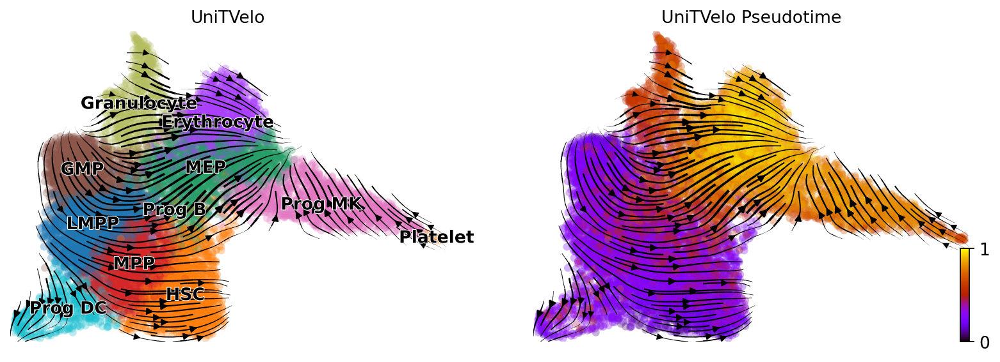

In [8]:

scv.tl.velocity_graph(adata_unv)
scv.pl.velocity_embedding_stream(adata_unv, color=['celltype','latent_time'], dpi=100, title=['UniTVelo', 'UniTVelo Pseudotime'],
                                 color_map='gnuplot')

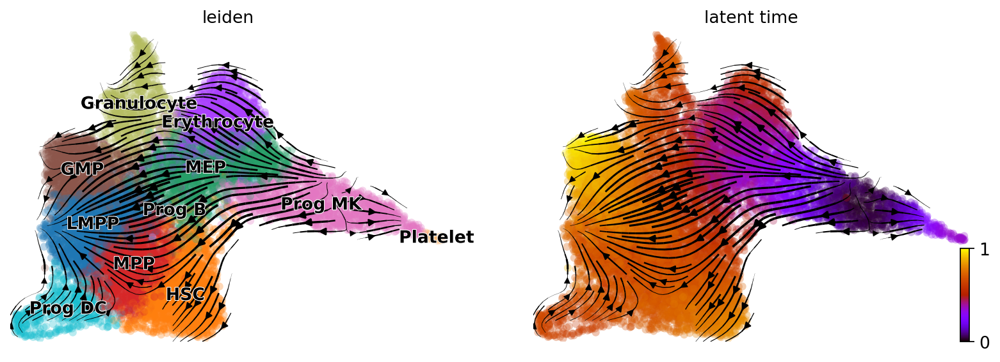

In [25]:
# sc.pp.neighbors(adata_mv)
# sc.tl.umap(adata_mv, n_components=2)

# scv.tl.velocity_graph(adata_mv)
scv.pl.velocity_embedding_stream(adata_mv, color=['leiden','latent_time'], dpi=100,color_map='gnuplot')

# CBDIR

In [9]:
cluster_edges = [
    ('HSC', 'MPP'), 
    # ('MPP', 'HSC'),
    ('MPP', 'LMPP'),
    # ('LMPP', 'MPP'),
    ('LMPP', 'GMP'),
    # ('GMP', 'LMPP'),
    ('GMP', 'Granulocyte'),
    #  ('Granulocyte','GMP' ),
    # ('GMP', 'Prog DC'),
    # ( 'Prog DC','GMP'),
    ( 'MEP', 'Erythrocyte'),
    # ( 'Erythrocyte', 'MEP' ),
    ('Prog MK', 'Platelet'),
    # ('Platelet', 'Prog MK')
    ]

# cluster_edges = [("RG, Astro, OPC", "IPC"),("V-SVZ", "Subplate"),
#                  ("RG, Astro, OPC","Ependymal cells"),

# ("V-SVZ" ,"Upper Layer"),
# ("V-SVZ", "Deeper Layer")]
exp_metrics = {}

In [10]:
trans = ['HSC -> MPP',
         'MPP -> LMPP',
'LMPP -> GMP',
'GMP -> Granulocyte',
# 'GMP -> Prog DC',
'MEP -> Erythrocyte',
'Prog MK -> Platelet'
]

# trans = ["RG, Astro, OPC → IPC",
# #"RG, Astro, OPC → V-SVZ",
# #"RG, Astro, OPC → Upper Layer",
# #"RG, Astro, OPC → Deeper Layer",
# "V-SVZ → Subplate",
# "RG, Astro, OPC → Ependymal cells",
# # "IPC → Upper Layer",
# # "IPC → Deeper Layer",
# "V-SVZ → Upper Layer",
# "V-SVZ → Deeper Layer"]

In [199]:
# import sys
# import importlib

# # Clear the module from cache
# sys.modules.pop('unitvelo', None)

# # Reload the module
# importlib.import_module('unitvelo')

%load_ext autoreload
%autoreload 2

import unitvelo as utv
importlib.reload(utv)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
(Running UniTVelo 0.2.5.2)
2024-08-31 15:22:52


<module 'unitvelo' from '/u/n/nelkazwi/miniforge3/envs/unitvelo/lib/python3.7/site-packages/unitvelo/__init__.py'>

In [11]:
scv.pp.neighbors(adata)
adata_velo = adata[:, adata.var.loc[adata.var['velocity_genes'] == True].index]
exp_metrics["model_dyn"] = utv.evaluate(adata_velo, cluster_edges, "celltype", 'velocity', 'X_umap')

computing neighbors
    finished (0:00:23) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
# Cross-Boundary Direction Correctness (A->B)
{('HSC', 'MPP'): 0.37668556238804873, ('MPP', 'LMPP'): 0.3989156582729487, ('LMPP', 'GMP'): 0.677547909852116, ('GMP', 'Granulocyte'): 0.6889568646330853, ('MEP', 'Erythrocyte'): 0.535591599120495, ('Prog MK', 'Platelet'): 0.517844864117575}
Total Mean: 0.5325904097307115
# In-cluster Coherence
{'Erythrocyte': 0.9997497, 'GMP': 0.99948895, 'Granulocyte': 0.9996489, 'HSC': 0.9995534, 'LMPP': 0.9993088, 'MEP': 0.9995939, 'MPP': 0.9994569, 'Platelet': 0.9999076, 'Prog B': 0.99994904, 'Prog DC': 0.99954534, 'Prog MK': 0.9996908}
Total Mean: 0.9996266961097717


In [198]:
import pandas as pd

# Define the data
data = {
    'Cell Type Pair': [
        'HSC MPP', 'MPP HSC', 'MPP LMPP', 'LMPP MPP', 'LMPP GMP', 'GMP LMPP',
        'GMP Granulocyte', 'Granulocyte GMP', 'GMP Prog DC', 'Prog DC GMP',
        'MEP Erythrocyte', 'Erythrocyte MEP', 'Prog MK Platelet', 'Platelet Prog MK'
    ],
    'n1': [
        1550, 1363, 1391, 1494, 780, 985, 128, 105, 328, 92, 1356, 1114, 78, 32
    ],
    'n2': [
        1157, 1167, 1027, 1155, 536, 996, 99, 207, 83, 224, 914, 1011, 27, 109
    ],
    'n1/n2': [
        1.3396715643906656, 1.1679520137103685, 1.3544303797468353, 1.2935064935064935,
        1.455223880597015, 0.9889558232931727, 1.292929292929293, 0.5072463768115942,
        3.9518072289156625, 0.4107142857142857, 1.4835886214442013, 1.1018793273986152,
        2.888888888888889, 0.29357798165137616
    ],
    'Size Ratio': [
        0.9594430992736077, 1.0422712933753944, 1.065615141955836, 0.9384251036116045, 
        0.7264653641207816, 1.3765281173594133, 0.6039119804400978, 1.6558704453441295, 
        0.4042379788101059, 2.473790322580645, 0.782292298362644, 1.2782945736434108, 
        0.026424442609413706, 37.84375
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Display the DataFrame
print(df)


      Cell Type Pair    n1    n2     n1/n2  Size Ratio
0            HSC MPP  1550  1157  1.339672    0.959443
1            MPP HSC  1363  1167  1.167952    1.042271
2           MPP LMPP  1391  1027  1.354430    1.065615
3           LMPP MPP  1494  1155  1.293506    0.938425
4           LMPP GMP   780   536  1.455224    0.726465
5           GMP LMPP   985   996  0.988956    1.376528
6    GMP Granulocyte   128    99  1.292929    0.603912
7    Granulocyte GMP   105   207  0.507246    1.655870
8        GMP Prog DC   328    83  3.951807    0.404238
9        Prog DC GMP    92   224  0.410714    2.473790
10   MEP Erythrocyte  1356   914  1.483589    0.782292
11   Erythrocyte MEP  1114  1011  1.101879    1.278295
12  Prog MK Platelet    78    27  2.888889    0.026424
13  Platelet Prog MK    32   109  0.293578   37.843750


In [12]:
CC = {}
cell_types = exp_metrics["model_dyn"]['In-cluster Coherence'].keys()
for type in cell_types:
    CC[type] = np.array(exp_metrics["model_dyn"]['In-cluster Coherence'][(type)]).mean()

In [13]:
CBDir ={}
for edge , t in zip(cluster_edges,trans):
 CBDir[t] = np.array(exp_metrics["model_dyn"]['Cross-Boundary Direction Correctness (A->B)'][(edge)]).mean()
 

In [14]:
scv.pp.neighbors(adata_unv)
adata_velo = adata_unv[:, adata_unv.var.loc[adata_unv.var['velocity_genes'] == True].index]
exp_metrics["model_dyn"] = utv.evaluate(adata_velo, cluster_edges, "celltype", 'velocity', 'X_umap')

computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
# Cross-Boundary Direction Correctness (A->B)
{('HSC', 'MPP'): -0.6262290999566074, ('MPP', 'LMPP'): -0.6616678579086505, ('LMPP', 'GMP'): -0.40820383597666937, ('GMP', 'Granulocyte'): 0.26400273698150456, ('MEP', 'Erythrocyte'): 0.3421832969468858, ('Prog MK', 'Platelet'): -0.8774378538418195}
Total Mean: -0.32789210229255933
# In-cluster Coherence
{'Erythrocyte': 0.9980891, 'GMP': 0.99669415, 'Granulocyte': 0.9966277, 'HSC': 0.99601763, 'LMPP': 0.99583644, 'MEP': 0.9968693, 'MPP': 0.99645627, 'Platelet': 0.99945056, 'Prog B': 0.9998212, 'Prog DC': 0.9963553, 'Prog MK': 0.99861825}
Total Mean: 0.9973487257957458


In [15]:
CC_unv = {}
cell_types = exp_metrics["model_dyn"]['In-cluster Coherence'].keys()
for type in cell_types:
    CC_unv[type] = np.array(exp_metrics["model_dyn"]['In-cluster Coherence'][(type)]).mean()

In [16]:
CBDir_unv ={}
for edge, t in zip(cluster_edges,trans):
 CBDir_unv[t] = np.array(exp_metrics["model_dyn"]['Cross-Boundary Direction Correctness (A->B)'][(edge)]).mean()

In [26]:
scv.pp.neighbors(adata_mv)
adata_velo = adata_mv[:, adata_mv.var.loc[adata_mv.var['velocity_genes'] == True].index]
exp_metrics["model_dyn"] = utv.evaluate(adata_velo, cluster_edges, "leiden")

computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
# Cross-Boundary Direction Correctness (A->B)
{('HSC', 'MPP'): 0.17830548685169215, ('MPP', 'LMPP'): 0.6705429697823645, ('LMPP', 'GMP'): -0.07587055283184915, ('GMP', 'Granulocyte'): -0.8467889344589274, ('MEP', 'Erythrocyte'): 0.016049746327035777, ('Prog MK', 'Platelet'): 0.6046845856212321}
Total Mean: 0.09115388354859132
# In-cluster Coherence
{'Erythrocyte': 0.9760941649545761, 'GMP': 0.9744620900222367, 'Granulocyte': 0.9586105185355748, 'HSC': 0.9760029647323382, 'LMPP': 0.9874723781673068, 'MEP': 0.9760405872271073, 'MPP': 0.9831516895298984, 'Platelet': 0.9957494467634493, 'Prog B': 0.9716343325680519, 'Prog DC': 0.9855574948343038, 'Prog MK': 0.8742920970488005}
Total Mean: 0.9690061603985128


In [27]:
CC_mv = {}
cell_types = exp_metrics["model_dyn"]['In-cluster Coherence'].keys()
for type in cell_types:
    CC_mv[type] = np.array(exp_metrics["model_dyn"]['In-cluster Coherence'][(type)]).mean()

In [28]:
CBDir_mv ={}
for edge , t in zip(cluster_edges,trans):
 CBDir_mv[t] = np.array(exp_metrics["model_dyn"]['Cross-Boundary Direction Correctness (A->B)'][(edge)]).mean()

In [29]:
methods = ['CRAK-Velo', 'UniTVelo', 'MultiVelo']#

CBDirs = {}
CBDirs[methods[0]] = CBDir
CBDirs[methods[1]] = CBDir_unv
CBDirs[methods[2]] = CBDir_mv

    


In [30]:
methods = ['CRAK-Velo', 'UniTVelo', 'MultiVelo']

CCs = {}
CCs[methods[0]] = CC
CCs[methods[1]] = CC_unv
CCs[methods[2]] = CC_mv

In [31]:
colors = ['#386641', '#6a994e', '#a7c957', '#f2e8cf', '#bc4749', '#7d8c2f', '#c1d3b5']

In [32]:
import matplotlib.colors as mcolors


In [ ]:
data = CBDirs
df = pd.DataFrame(data).T.reset_index()
df.columns = ['Method'] + list(df.columns[1:])
def adjust_saturation(palette, factor=1.5):
    """Increase the saturation of a color palette."""
    adjusted_palette = []
    for color in palette:
        # Convert color to HSV (Hue, Saturation, Value)
        rgb = mcolors.to_rgba(color)[:3]
        hsv = mcolors.rgb_to_hsv(rgb)
        hsv[1] = min(hsv[1] * factor, 1)  # Increase saturation but keep it in [0, 1]
        rgb = mcolors.hsv_to_rgb(hsv)
        adjusted_palette.append(mcolors.to_hex(rgb))
    return adjusted_palette

# Use the Set2 color palette
palette = sns.color_palette('Set2')

# Increase the saturation of the palette
palette = adjust_saturation(palette, factor=1.5)


# Melt the DataFrame to long format suitable for Seaborn
df_melted = df.melt(id_vars='Method', var_name='Metric', value_name='Value')

# Create the bar plot with Seaborn
plt.figure(figsize=(12, 8))
#sns.set_palette(colors)  # Set the color palette

# Plot with Seaborn
bar_plot = sns.barplot(data=df_melted, x='Method', y='Value', hue='Metric', palette=palette)

# Adjusting legend position
bar_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Adding labels and title
plt.xlabel('', fontsize=14) 
plt.ylabel('CBDir', fontsize=20)
plt.xticks(fontsize=20)

bar_plot.spines['top'].set_visible(False)
bar_plot.spines['right'].set_visible(False)

plt.tight_layout() 

fig_path = '/data/nelkazwi/RNA_velo/Unitvelo_atac/CRAK_Velo_fig/'
# plt.savefig(fig_path+'CBDir_HSPC_no_Pro_DC.png', dpi=300)
# plt.savefig(fig_path+'CBDir_HSPC_no_Pro_DC.pdf', dpi=300)
# Adjust layout

plt.show()




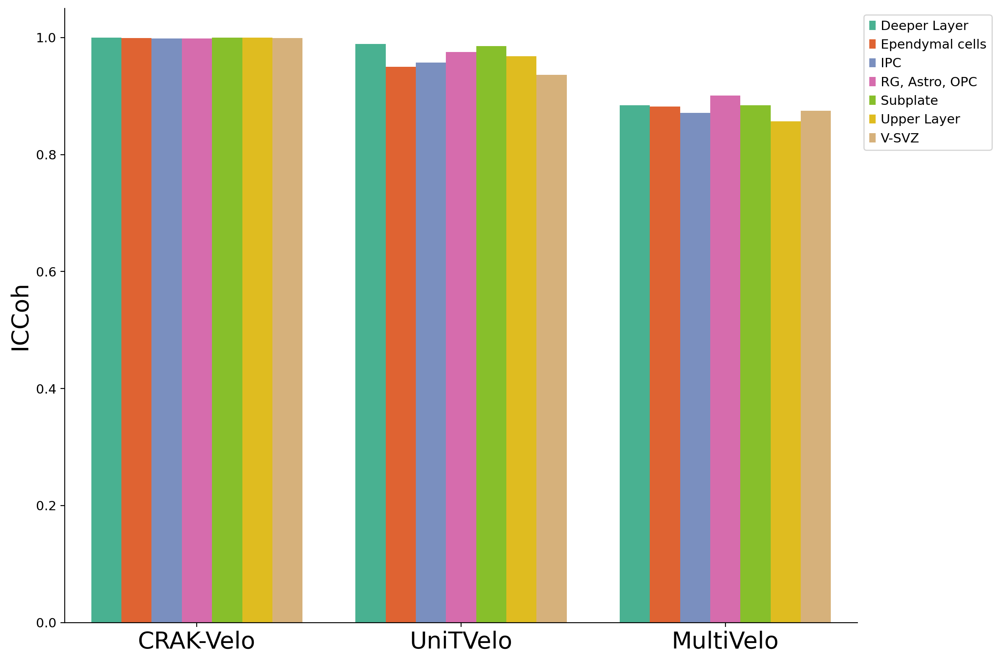

In [127]:
data = CCs
df = pd.DataFrame(data).T.reset_index()
df.columns = ['Method'] + list(df.columns[1:])
def adjust_saturation(palette, factor=1.5):
    """Increase the saturation of a color palette."""
    adjusted_palette = []
    for color in palette:
        # Convert color to HSV (Hue, Saturation, Value)
        rgb = mcolors.to_rgba(color)[:3]
        hsv = mcolors.rgb_to_hsv(rgb)
        hsv[1] = min(hsv[1] * factor, 1)  # Increase saturation but keep it in [0, 1]
        rgb = mcolors.hsv_to_rgb(hsv)
        adjusted_palette.append(mcolors.to_hex(rgb))
    return adjusted_palette

# Use the Set2 color palette
palette = sns.color_palette('Set2')

# Increase the saturation of the palette
palette = adjust_saturation(palette, factor=1.5)


# Melt the DataFrame to long format suitable for Seaborn
df_melted = df.melt(id_vars='Method', var_name='Metric', value_name='Value')

# Create the bar plot with Seaborn
plt.figure(figsize=(12, 8))
#sns.set_palette(colors)  # Set the color palette

# Plot with Seaborn
bar_plot = sns.barplot(data=df_melted, x='Method', y='Value', hue='Metric', palette=palette)

# Adjusting legend position
bar_plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Adding labels and title
plt.xlabel('', fontsize=14) 
plt.ylabel('ICCoh', fontsize=20)
plt.xticks(fontsize=20)

bar_plot.spines['top'].set_visible(False)
bar_plot.spines['right'].set_visible(False)

plt.tight_layout() 

fig_path = '/data/nelkazwi/RNA_velo/Unitvelo_atac/CRAK_Velo_fig/'
plt.savefig(fig_path+'ICCoh_10X_mouse_brain.png', dpi=300)
plt.savefig(fig_path+'ICCoh_10X_mouse_brain.pdf', dpi=300)


plt.show()


